# Cancer Data Analysis

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [30]:
df = pd.read_csv('cancer_reg.csv')

In [31]:
df.head()

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,binnedInc,MedianAge,...,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
0,1397.0,469,164.9,489.8,61898,260131,11.2,499.748204,"(61494.5, 125635]",39.3,...,NaN,41.6,32.9,14.0,81.780529,2.594728,4.821857,1.843479,52.856076,6.118831
1,173.0,70,161.3,411.6,48127,43269,18.6,23.111234,"(48021.6, 51046.4]",33.0,...,53.8,43.6,31.1,15.3,89.228509,0.969102,2.246233,3.741352,45.372500,4.333096
2,102.0,50,174.7,349.7,49348,21026,14.6,47.560164,"(48021.6, 51046.4]",45.0,...,43.5,34.9,42.1,21.1,90.922190,0.739673,0.465898,2.747358,54.444868,3.729488
3,427.0,202,194.8,430.4,44243,75882,17.1,342.637253,"(42724.4, 45201]",42.8,...,40.3,35.0,45.3,25.0,91.744686,0.782626,1.161359,1.362643,51.021514,4.603841
4,57.0,26,144.4,350.1,49955,10321,12.5,0.000000,"(48021.6, 51046.4]",48.3,...,43.9,35.1,44.0,22.7,94.104024,0.270192,0.665830,0.492135,54.027460,6.796657


DESCRIPTION
Predict cancer mortality rates for US counties.
SUMMARY
Multiple Linear Regression Challenge
Background
These data were aggregated from a number of sources including the American Community Survey (census.gov), clinicaltrials.gov, and cancer.gov. Most of the data preparation process can be veiwed here.

Your Task: Build a multivariate Ordinary Least Squares regression model to predict "TARGET_deathRate"
Deliverables
a. Your final model equation

b. The statistical software output including (adjusted) R-squared and Root Mean Squared Error (RMSE)

c. Your code file (if you used a programming language)

d. Model diagnostics including statistics and visualizations:

- Assess linearity of model (parameters)
- Assess serial independence of errors
- Assess heteroskedasticity
- Assess normality of residual distribution
- Assess multicollinearity
e. Your interpretation of the model

f. Other factors to consider:

- Are there any outliers?
- Are there missing values?
- How will you handle categorical variables?

TARGET_deathRate: Dependent variable. Mean per capita (100,000) cancer mortalities(a)

avgAnnCount: Mean number of reported cases of cancer diagnosed annually(a)

avgDeathsPerYear: Mean number of reported mortalities due to cancer(a)

incidenceRate: Mean per capita (100,000) cancer diagoses(a)

medianIncome: Median income per county (b)

popEst2015: Population of county (b)

povertyPercent: Percent of populace in poverty (b)

studyPerCap: Per capita number of cancer-related clinical trials per county (a)

binnedInc: Median income per capita binned by decile (b)

MedianAge: Median age of county residents (b)

MedianAgeMale: Median age of male county residents (b)

MedianAgeFemale: Median age of female county residents (b)

Geography: County name (b)

AvgHouseholdSize: Mean household size of county (b)

PercentMarried: Percent of county residents who are married (b)

PctNoHS18_24: Percent of county residents ages 18-24 highest education attained: less than high school (b)

PctHS18_24: Percent of county residents ages 18-24 highest education attained: high school diploma (b)

PctSomeCol18_24: Percent of county residents ages 18-24 highest education attained: some college (b)

PctBachDeg18_24: Percent of county residents ages 18-24 highest education attained: bachelor's degree (b)

PctHS25_Over: Percent of county residents ages 25 and over highest education attained: high school diploma (b)

PctBachDeg25_Over: Percent of county residents ages 25 and over highest education attained: bachelor's degree (b)

PctEmployed16_Over: Percent of county residents ages 16 and over employed (b)

PctUnemployed16_Over: Percent of county residents ages 16 and over unemployed (b)

PctPrivateCoverage: Percent of county residents with private health coverage (b)

PctPrivateCoverageAlone: Percent of county residents with private health coverage alone (no public assistance) (b)

PctEmpPrivCoverage: Percent of county residents with employee-provided private health coverage (b)

PctPublicCoverage: Percent of county residents with government-provided health coverage (b)

PctPubliceCoverageAlone: Percent of county residents with government-provided health coverage alone (b)

PctWhite: Percent of county residents who identify as White (b)

PctBlack: Percent of county residents who identify as Black (b)

PctAsian: Percent of county residents who identify as Asian (b)

PctOtherRace: Percent of county residents who identify in a category which is not White, Black, or Asian (b)

PctMarriedHouseholds: Percent of married households (b)

BirthRate: Number of live births relative to number of women in county (b)

(a): years 2010-2016

(b): 2013 Census Estimates

In [33]:
df.columns

Index(['avgAnnCount', 'avgDeathsPerYear', 'TARGET_deathRate', 'incidenceRate',
       'medIncome', 'popEst2015', 'povertyPercent', 'studyPerCap', 'binnedInc',
       'MedianAge', 'MedianAgeMale', 'MedianAgeFemale', 'Geography',
       'AvgHouseholdSize', 'PercentMarried', 'PctNoHS18_24', 'PctHS18_24',
       'PctSomeCol18_24', 'PctBachDeg18_24', 'PctHS25_Over',
       'PctBachDeg25_Over', 'PctEmployed16_Over', 'PctUnemployed16_Over',
       'PctPrivateCoverage', 'PctPrivateCoverageAlone', 'PctEmpPrivCoverage',
       'PctPublicCoverage', 'PctPublicCoverageAlone', 'PctWhite', 'PctBlack',
       'PctAsian', 'PctOtherRace', 'PctMarriedHouseholds', 'BirthRate'],
      dtype='object')

In [32]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3047 entries, 0 to 3046
Data columns (total 34 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   avgAnnCount              3047 non-null   float64
 1   avgDeathsPerYear         3047 non-null   int64  
 2   TARGET_deathRate         3047 non-null   float64
 3   incidenceRate            3047 non-null   float64
 4   medIncome                3047 non-null   int64  
 5   popEst2015               3047 non-null   int64  
 6   povertyPercent           3047 non-null   float64
 7   studyPerCap              3047 non-null   float64
 8   binnedInc                3047 non-null   object 
 9   MedianAge                3047 non-null   float64
 10  MedianAgeMale            3047 non-null   float64
 11  MedianAgeFemale          3047 non-null   float64
 12  Geography                3047 non-null   object 
 13  AvgHouseholdSize         3047 non-null   float64
 14  PercentMarried          

In [34]:
df.describe()

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,...,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
count,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3.047000e+03,3047.000000,3047.000000,3047.000000,3047.000000,...,2438.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000
mean,606.338544,185.965868,178.664063,448.268586,47063.281917,1.026374e+05,16.878175,155.399415,45.272333,39.570725,...,48.453774,41.196324,36.252642,19.240072,83.645286,9.107978,1.253965,1.983523,51.243872,5.640306
std,1416.356223,504.134286,27.751511,54.560733,12040.090836,3.290592e+05,6.409087,529.628366,45.304480,5.226017,...,10.083006,9.447687,7.841741,6.113041,16.380025,14.534538,2.610276,3.517710,6.572814,1.985816
min,6.000000,3.000000,59.700000,201.300000,22640.000000,8.270000e+02,3.200000,0.000000,22.300000,22.400000,...,15.700000,13.500000,11.200000,2.600000,10.199155,0.000000,0.000000,0.000000,22.992490,0.000000
25%,76.000000,28.000000,161.200000,420.300000,38882.500000,1.168400e+04,12.150000,0.000000,37.700000,36.350000,...,41.000000,34.500000,30.900000,14.850000,77.296180,0.620675,0.254199,0.295172,47.763063,4.521419
50%,171.000000,61.000000,178.100000,453.549422,45207.000000,2.664300e+04,15.900000,0.000000,41.000000,39.600000,...,48.700000,41.100000,36.300000,18.800000,90.059774,2.247576,0.549812,0.826185,51.669941,5.381478
75%,518.000000,149.000000,195.200000,480.850000,52492.000000,6.867100e+04,20.400000,83.650776,44.000000,42.500000,...,55.600000,47.700000,41.550000,23.100000,95.451693,10.509732,1.221037,2.177960,55.395132,6.493677
max,38150.000000,14010.000000,362.800000,1206.900000,125635.000000,1.017029e+07,47.400000,9762.308998,624.000000,64.700000,...,78.900000,70.700000,65.100000,46.600000,100.000000,85.947799,42.619425,41.930251,78.075397,21.326165


## Exploratory Data Analysis

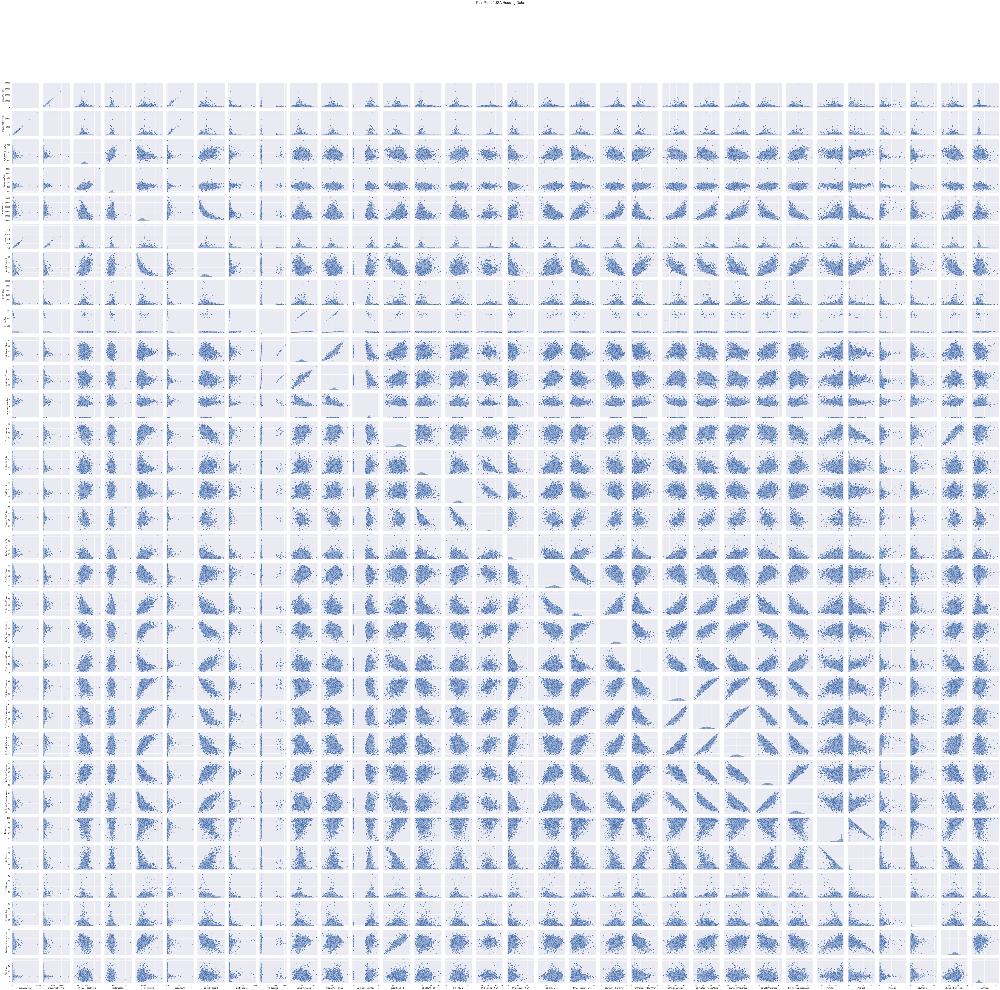

In [35]:
# Set a different style
sns.set_style("whitegrid")

# Set custom figure size and context
sns.set(rc={'figure.figsize': (10, 8)})
sns.set_context("paper", font_scale=1.2)

# Generate the pairplot
sns.pairplot(df)

plt.suptitle("Pair Plot of USA Housing Data", size=20)
plt.subplots_adjust(top=0.9)
# Show the plot
plt.show()

C:\Users\Aditya Dabrase\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='avgDeathsPerYear', ylabel='Density'>

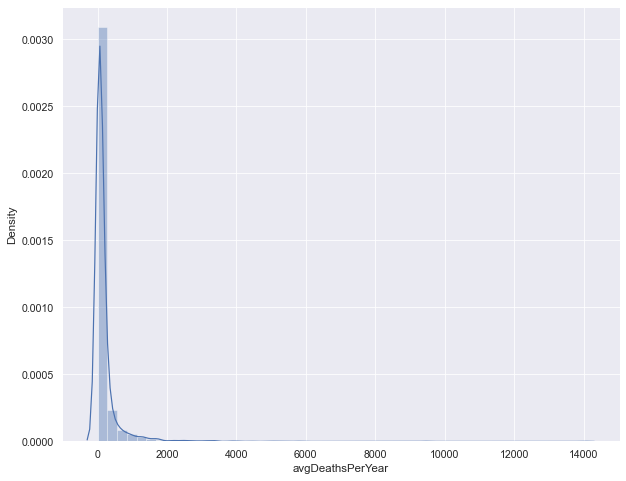

In [36]:
sns.distplot(df['avgDeathsPerYear'])

C:\Users\Aditya Dabrase\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


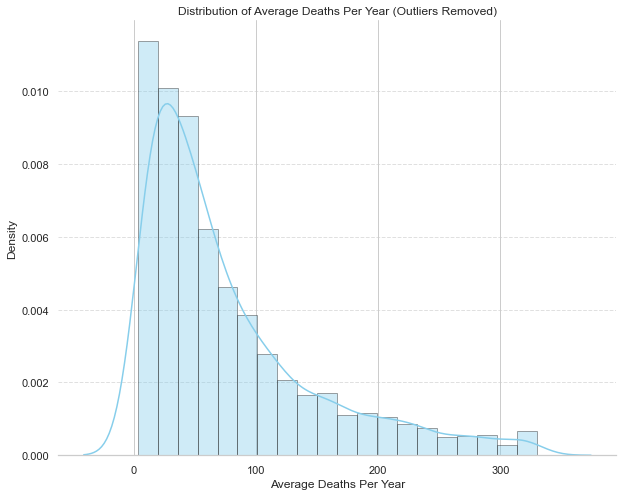

In [37]:
#ignoring the outliers we have this:

from scipy import stats

# Load your data (replace 'df' with your DataFrame and 'avgDeathsPerYear' with your column)
data = df['avgDeathsPerYear']

# Calculate the IQR
Q1 = np.percentile(data, 25)
Q3 = np.percentile(data, 75)
IQR = Q3 - Q1

# Define the lower and upper bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter out the outliers
filtered_data = data[(data >= lower_bound) & (data <= upper_bound)]

# Create the distribution plot for filtered data
sns.set(style="whitegrid")
sns.distplot(filtered_data, kde=True, hist_kws={'edgecolor': 'k'}, bins=20, color='skyblue')

# Add labels and a title
plt.xlabel("Average Deaths Per Year")
plt.ylabel("Density")
plt.title("Distribution of Average Deaths Per Year (Outliers Removed)")

# Customize the appearance
sns.despine(left=True)
plt.grid(axis='y', linestyle='--', alpha=0.6)

# Show the plot
plt.show()


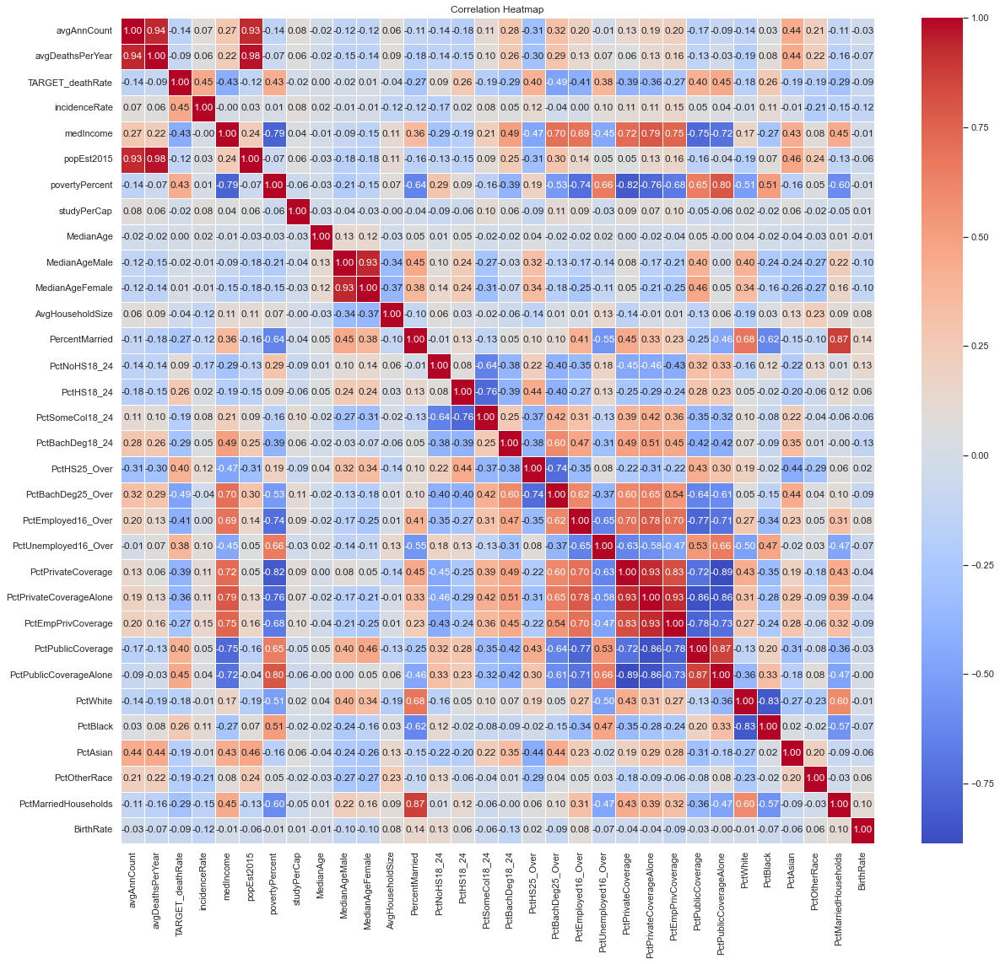

In [40]:
# Create a larger figure size
plt.figure(figsize=(20, 18))

correlation_matrix = df.corr()

# Customize the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)

# Set the title
plt.title("Correlation Heatmap")

# Show the heatmap
plt.show()


In [48]:
from sklearn.preprocessing import StandardScaler
import pandas as pd  # If your data is in a DataFrame


In [49]:
#for improved model performance
scaler = StandardScaler()


In [70]:
df1 = df[['PctAsian', 'popEst2015', 'avgAnnCount','PctOtherRace','avgDeathsPerYear']]


In [71]:
df1

,PctAsian,popEst2015,avgAnnCount,PctOtherRace,avgDeathsPerYear
0,4.821857,260131,1397.000000,1.843479,469
1,2.246233,43269,173.000000,3.741352,70
2,0.465898,21026,102.000000,2.747358,50
3,1.161359,75882,427.000000,1.362643,202
4,0.665830,10321,57.000000,0.492135,26
...,...,...,...,...,...
3042,0.327613,6343,1962.667684,1.700468,15
3043,4.044920,37118,1962.667684,14.130288,43
3044,1.316472,34536,1962.667684,5.680705,46
3045,0.244632,25609,1962.667684,2.131790,52


In [106]:
df1.describe()

,PctAsian,popEst2015,avgAnnCount,PctOtherRace,avgDeathsPerYear
count,3047.000000,3.047000e+03,3047.000000,3047.000000,3047.000000
mean,1.253965,1.026374e+05,606.338544,1.983523,185.965868
std,2.610276,3.290592e+05,1416.356223,3.517710,504.134286
min,0.000000,8.270000e+02,6.000000,0.000000,3.000000
25%,0.254199,1.168400e+04,76.000000,0.295172,28.000000
50%,0.549812,2.664300e+04,171.000000,0.826185,61.000000
75%,1.221037,6.867100e+04,518.000000,2.177960,149.000000
max,42.619425,1.017029e+07,38150.000000,41.930251,14010.000000


In [72]:
# Assuming 'data' is a NumPy array or DataFrame
standardized_data = scaler.fit_transform(df1)


In [73]:
standardized_df = pd.DataFrame(standardized_data, columns=df1.columns)

In [77]:
standardized_df

,PctAsian,popEst2015,avgAnnCount,PctOtherRace,avgDeathsPerYear
0,1.367088,0.478696,0.558328,-0.039818,0.561518
1,0.380201,-0.180448,-0.306003,0.499790,-0.230067
2,-0.301959,-0.248055,-0.356140,0.217176,-0.269746
3,-0.035483,-0.081322,-0.126640,-0.176530,0.031811
4,-0.225352,-0.280592,-0.387917,-0.424035,-0.317360
...,...,...,...,...,...
3042,-0.354945,-0.292683,0.957776,-0.080479,-0.339183
3043,1.069394,-0.199144,0.957776,3.453599,-0.283633
3044,0.023950,-0.206992,0.957776,1.051192,-0.277682
3045,-0.386740,-0.234125,0.957776,0.042156,-0.265778


In [107]:
standardized_df.describe()

,PctAsian,popEst2015,avgAnnCount,PctOtherRace,avgDeathsPerYear
count,3.047000e+03,3.047000e+03,3.047000e+03,3.047000e+03,3.047000e+03
mean,-2.747319e-17,-7.644397e-17,6.143210e-17,-1.882861e-17,3.273828e-17
std,1.000164e+00,1.000164e+00,1.000164e+00,1.000164e+00,1.000164e+00
min,-4.804743e-01,-3.094491e-01,-4.239308e-01,-5.639602e-01,-3.629904e-01
25%,-3.830744e-01,-2.764496e-01,-3.745001e-01,-4.800362e-01,-3.133923e-01
50%,-2.698062e-01,-2.309823e-01,-3.074156e-01,-3.290572e-01,-2.479228e-01
75%,-1.261670e-02,-1.032396e-01,-6.238052e-02,5.528289e-02,-7.333747e-02
max,1.584976e+01,3.060029e+01,2.651157e+01,1.135775e+01,2.742583e+01


In [74]:
standardized_df

,PctAsian,popEst2015,avgAnnCount,PctOtherRace,avgDeathsPerYear
0,1.367088,0.478696,0.558328,-0.039818,0.561518
1,0.380201,-0.180448,-0.306003,0.499790,-0.230067
2,-0.301959,-0.248055,-0.356140,0.217176,-0.269746
3,-0.035483,-0.081322,-0.126640,-0.176530,0.031811
4,-0.225352,-0.280592,-0.387917,-0.424035,-0.317360
...,...,...,...,...,...
3042,-0.354945,-0.292683,0.957776,-0.080479,-0.339183
3043,1.069394,-0.199144,0.957776,3.453599,-0.283633
3044,0.023950,-0.206992,0.957776,1.051192,-0.277682
3045,-0.386740,-0.234125,0.957776,0.042156,-0.265778


In [78]:
# Split the DataFrame into X and y
X = standardized_df.iloc[:, :-1]  # All columns except the last one
y = standardized_df.iloc[:, -1]  # The last column

In [80]:
y

0       0.561518
1      -0.230067
2      -0.269746
3       0.031811
4      -0.317360
          ...   
3042   -0.339183
3043   -0.283633
3044   -0.277682
3045   -0.265778
3046   -0.273714
Name: avgDeathsPerYear, Length: 3047, dtype: float64

In [81]:
from sklearn.model_selection import train_test_split

In [82]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=101)

In [84]:
from sklearn.linear_model import LinearRegression


In [85]:
lm = LinearRegression()

In [86]:
lm.fit(X_train,y_train)

LinearRegression()

# Model evaluation

In [87]:
# print the intercept
print(lm.intercept_)

0.002205109380718469


In [88]:
coeff_df = pd.DataFrame(lm.coef_,X.columns,columns=['Coefficient'])
coeff_df

,Coefficient
PctAsian,-0.023781
popEst2015,0.794140
avgAnnCount,0.236496
PctOtherRace,-0.018307


In [89]:
predictions = lm.predict(X_test)

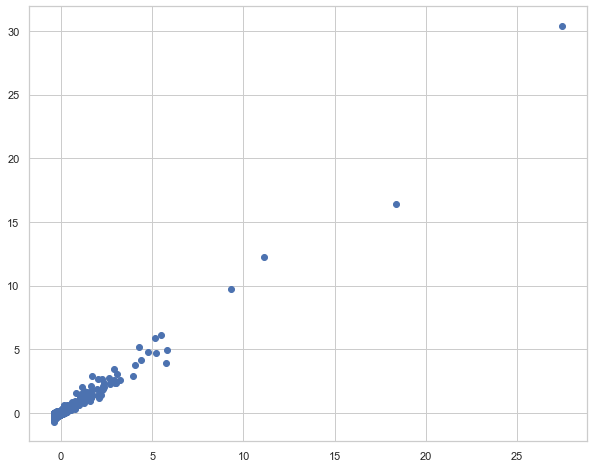

In [90]:
plt.scatter(y_test,predictions)

C:\Users\Aditya Dabrase\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


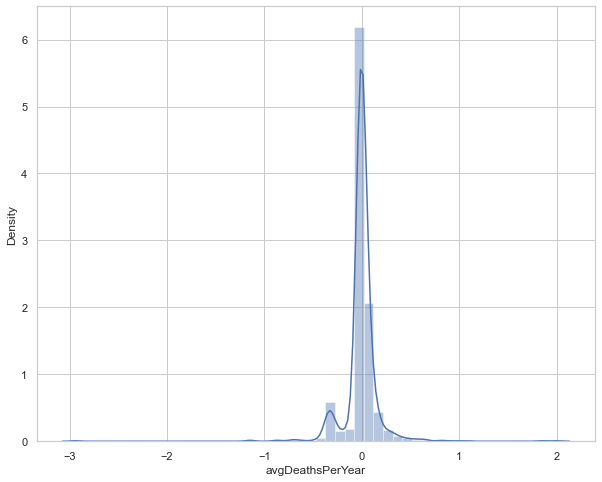

In [91]:
#residual Histogram

sns.distplot((y_test-predictions),bins=50);

# Regression Evaluation Metrics


Here are three common evaluation metrics for regression problems:

**Mean Absolute Error** (MAE) is the mean of the absolute value of the errors:

$$\frac 1n\sum_{i=1}^n|y_i-\hat{y}_i|$$

**Mean Squared Error** (MSE) is the mean of the squared errors:

$$\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2$$

**Root Mean Squared Error** (RMSE) is the square root of the mean of the squared errors:

$$\sqrt{\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2}$$

Comparing these metrics:

- **MAE** is the easiest to understand, because it's the average error.
- **MSE** is more popular than MAE, because MSE "punishes" larger errors, which tends to be useful in the real world.
- **RMSE** is even more popular than MSE, because RMSE is interpretable in the "y" units.

All of these are **loss functions**, because we want to minimize them.

In [96]:
from sklearn import metrics

In [97]:
print('MAE:', metrics.mean_absolute_error(y_test, predictions))
print('MSE:', metrics.mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))

MAE: 0.08303520855329033
MSE: 0.0368649196792702
RMSE: 0.19200239498316213


In [98]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score

In [99]:
# Initialize regression models
models = {
    "Linear Regression": LinearRegression(),
    "Decision Tree": DecisionTreeRegressor(),
    "Random Forest": RandomForestRegressor(),
    "Gradient Boosting": GradientBoostingRegressor(),
    "SVM": SVR(),
    "KNN": KNeighborsRegressor(),
}

In [100]:
# Train and evaluate each model
results = {}
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    results[name] = {"MSE": mse, "R-squared": r2}

In [103]:
pip install tabulate


Note: you may need to restart the kernel to use updated packages.


In [105]:

from tabulate import tabulate


# Create a list of lists for the tabulate function
table = []
for name, metrics in results.items():
    row = [name, f"{metrics['MSE']:.2f}", f"{metrics['R-squared']:.2f}"]
    table.append(row)

# Specify the table headers
headers = ["Model", "MSE", "R-squared"]

# Print the table
print(tabulate(table, headers, tablefmt="pretty"))

# Select the best model based on your chosen criteria
best_model = min(results, key=lambda x: results[x]["MSE"])

print(f"\nThe best model is: {best_model}")


+-------------------+------+-----------+
|       Model       | MSE  | R-squared |
+-------------------+------+-----------+
| Linear Regression | 0.04 |   0.98    |
|   Decision Tree   | 0.34 |   0.78    |
|   Random Forest   | 0.37 |   0.75    |
| Gradient Boosting | 0.34 |   0.77    |
|        SVM        | 0.94 |   0.38    |
|        KNN        | 0.44 |   0.71    |
+-------------------+------+-----------+

The best model is: Linear Regression


In [102]:
# Select the best model based on your chosen criteria
best_model = min(results, key=lambda x: results[x]["MSE"])

print(f"The best model is: {best_model}")

The best model is: Linear Regression


Explanation:

MSE is a measure of the average squared differences between predicted and actual values. 
A low MSE indicates that the model's predictions are close to the actual values.

R-squared is a measure of how well the model explains the variance in the data. 
An R-squared of 0.98 suggests that 98% of the variance in the target variable is explained by the model. This is a very good fit.